In [78]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
from scipy import stats
import pandas as pd
from math import sqrt

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import sklearn.preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, LassoLars, TweedieRegressor
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score
from sklearn.feature_selection import f_regression 
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import SelectKBest, f_regression, RFE

import os
import env
import wrangle

In [79]:
train, validate, test = wrangle.wrangle_zillow()
train_scaled, validate_scaled, test_scaled = wrangle.scale_data(train, validate, test)


In [80]:
train_scaled.head()

,bedrooms,bathrooms,square_feet,tax_value,year_built,lot_square_feet,fips,region_zip,transaction_date,latitude,longitude,fireplace,full_bathroom,decade,fips_str,house_size,house_size_large,house_size_medium,house_size_small
24464,0.250,0.333333,0.590186,878191.0,1957.0,0.539205,6037.0,96247.0,2017-05-23,33.789230,-118.112859,0.0,0.428571,1950,"Los Angeles, CA",large,1,0,0
13009,0.125,0.000000,0.452413,68299.0,1947.0,0.606248,6037.0,96192.0,2017-03-30,34.016067,-118.110143,0.0,0.142857,1940,"Los Angeles, CA",medium,0,1,0
51460,0.375,0.333333,0.668105,735390.0,1945.0,0.451486,6037.0,96045.0,2017-09-19,34.034575,-118.424093,0.0,0.428571,1940,"Los Angeles, CA",large,1,0,0
13951,0.250,0.166667,0.398490,77194.0,1969.0,0.419531,6059.0,96964.0,2017-03-27,33.654867,-117.977655,0.0,0.285714,1960,"Orange, CA",medium,0,1,0
5644,0.250,0.000000,0.211378,305481.0,1957.0,0.411833,6037.0,96488.0,2017-02-14,34.014855,-117.912250,0.0,0.142857,1950,"Los Angeles, CA",small,0,0,1


In [4]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
bedrooms,23844.0,3.206090,0.853612,1.000000,3.000000,3.000000,4.000000,8.000000e+00
bathrooms,23844.0,2.098809,0.764662,1.000000,2.000000,2.000000,2.500000,7.500000e+00
square_feet,23844.0,1681.554857,628.076744,326.000000,1227.000000,1547.000000,2023.000000,3.858000e+03
tax_value,23844.0,374129.261701,247735.559799,3254.000000,176057.250000,337307.000000,520114.000000,1.163971e+06
year_built,23844.0,1961.805570,22.141575,1900.000000,1950.000000,1959.000000,1976.000000,2.015000e+03
lot_square_feet,23844.0,6624.645697,2071.019628,1313.000000,5400.000000,6500.000000,7700.000000,1.248700e+04
fips,23844.0,6049.223452,20.996044,6037.000000,6037.000000,6037.000000,6059.000000,6.111000e+03
region_zip,23844.0,96568.961458,419.251635,95982.000000,96208.000000,96415.000000,96996.000000,9.733000e+04
logerror,23844.0,0.016550,0.159562,-2.331727,-0.023908,0.005931,0.036561,3.100913e+00
latitude,23844.0,34.016593,0.271036,33.344252,33.825437,33.997181,34.186903,3.471836e+01


In [5]:
train.head(2)

,bedrooms,bathrooms,square_feet,tax_value,year_built,lot_square_feet,fips,region_zip,logerror,transaction_date,latitude,longitude,fireplace,full_bathroom,decade,fips_str,house_size,house_size_large,house_size_medium,house_size_small
24462,3.0,3.0,1588.0,540000.0,1989.0,6889.0,6037.0,96377.0,0.004889,2017-05-10,34.433601,-118.552887,0.0,3.0,1980,"Los Angeles, CA",medium,0,1,0
12994,3.0,2.0,1532.0,72387.0,1969.0,8145.0,6111.0,96351.0,-0.033810,2017-03-23,34.178609,-118.941942,1.0,2.0,1960,"Ventura, CA",medium,0,1,0


year_built
1955.0    1012
1950.0     815
1954.0     777
1953.0     736
1956.0     684
          ... 
1903.0      11
1901.0      11
1904.0       9
1902.0       8
1900.0       6
Name: year_built, Length: 116, dtype: int64
1955.0    4.244254
1950.0    3.418051
1954.0    3.258681
1953.0    3.086730
1956.0    2.868646
            ...   
1903.0    0.046133
1901.0    0.046133
1904.0    0.037745
1902.0    0.033551
1900.0    0.025164
Name: year_built, Length: 116, dtype: float64


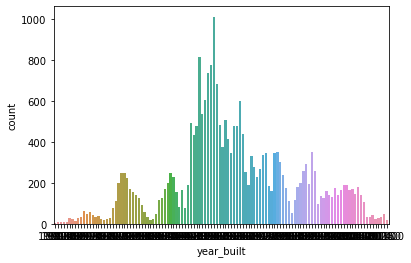

fips
6037.0    15302
6059.0     6551
6111.0     1991
Name: fips, dtype: int64
6037.0    64.175474
6059.0    27.474417
6111.0     8.350109
Name: fips, dtype: float64


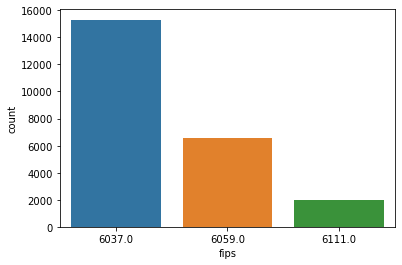

region_zip
97319.0    331
97318.0    312
97328.0    263
97329.0    246
96193.0    245
          ... 
95995.0      1
97324.0      1
96148.0      1
96434.0      1
96039.0      1
Name: region_zip, Length: 371, dtype: int64
97319.0    1.388190
97318.0    1.308505
97328.0    1.103003
97329.0    1.031706
96193.0    1.027512
             ...   
95995.0    0.004194
97324.0    0.004194
96148.0    0.004194
96434.0    0.004194
96039.0    0.004194
Name: region_zip, Length: 371, dtype: float64


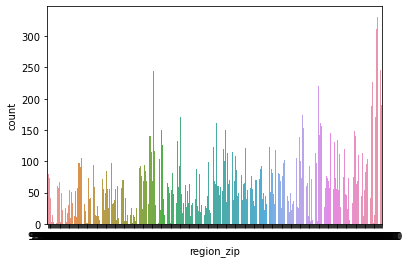

decade
1950    6539
1960    3811
1970    2755
1940    2556
1980    1941
1920    1708
1990    1536
2000    1355
1930     886
1910     381
2010     201
1900     175
Name: decade, dtype: int64
1950    27.424090
1960    15.983057
1970    11.554269
1940    10.719678
1980     8.140413
1920     7.163228
1990     6.441872
2000     5.682771
1930     3.715819
1910     1.597886
2010     0.842979
1900     0.733937
Name: decade, dtype: float64


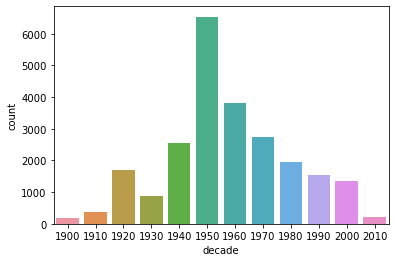

house_size
medium    15591
large      4568
small      3685
Name: house_size, dtype: int64
medium    65.387519
large     19.157859
small     15.454622
Name: house_size, dtype: float64


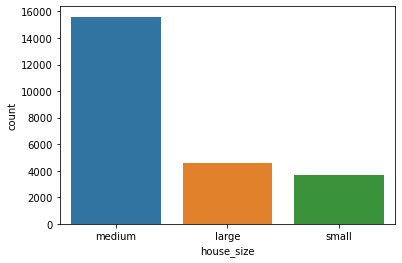

In [6]:
num_vars = ['bedrooms', 'bathrooms', 'square_feet', 'tax_value', 'lot_square_feet', 'fireplace', 'full_bathroom']
cat_vars = ['year_built', 'fips', 'region_zip', 'decade', 'house_size']

for col in cat_vars:
    print(col)
    print(train[col].value_counts())
    print(train[col].value_counts(normalize=True)*100)
    sns.countplot(x=col, data=train)
    plt.show()

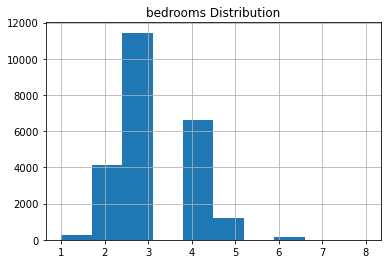

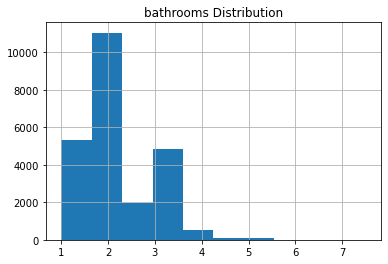

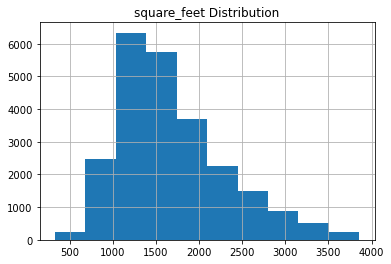

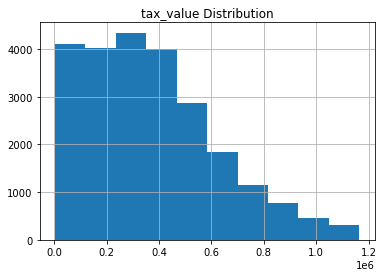

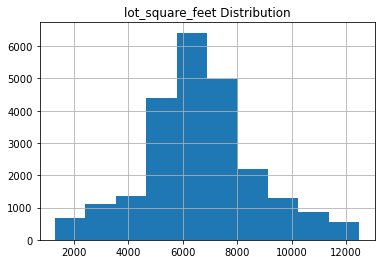

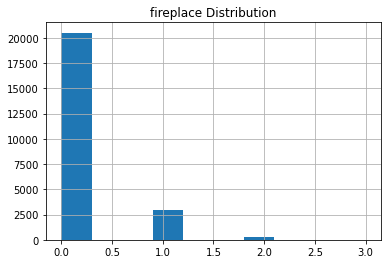

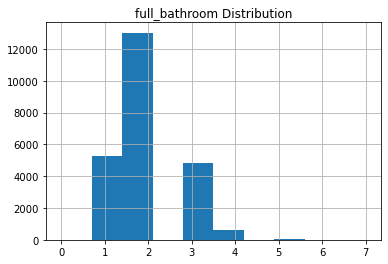

In [7]:
for col in num_vars:
    train[col].hist()
    plt.title(col+' Distribution')
    plt.show()

In [8]:
def cat_vis(train, col):
    plt.title('Relationship of tax value and '+col)
    sns.barplot(x=col, y='tax_value', data=train)
    plt.show()
    
    
def cat_test(train, col):
    alpha = 0.05
    null_hyp = col+' and tax value are independent'
    alt_hyp = 'There is a relationship between tax value and '+col
    observed = pd.crosstab(train.tax_value, train[col])
    chi2, p, degf, expected = stats.chi2_contingency(observed)
    if p < alpha:
        print('We reject the null hypothesis that', null_hyp)
        print(alt_hyp)
    else:
        print('We fail to reject the null hypothesis that', null_hyp)
        print('There appears to be no relationship between tax value and '+col)

def cat_analysis(train, col):
    cat_vis(train, col)
    cat_test(train, col)

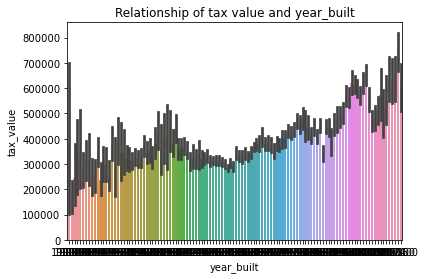

We reject the null hypothesis that year_built and tax value are independent
There is a relationship between tax value and year_built


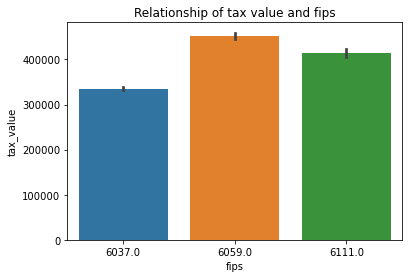

We reject the null hypothesis that fips and tax value are independent
There is a relationship between tax value and fips


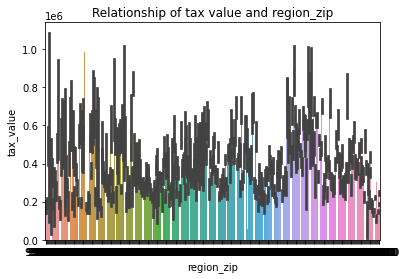

We reject the null hypothesis that region_zip and tax value are independent
There is a relationship between tax value and region_zip


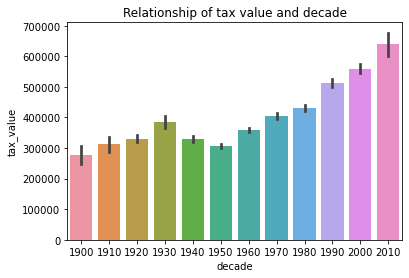

We reject the null hypothesis that decade and tax value are independent
There is a relationship between tax value and decade


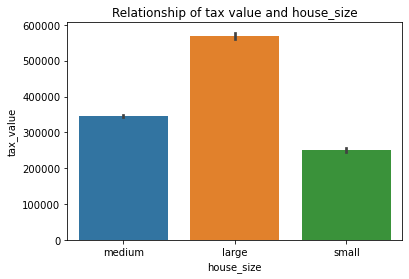

We reject the null hypothesis that house_size and tax value are independent
There is a relationship between tax value and house_size


In [9]:
for col in cat_vars:
    cat_analysis(train, col)

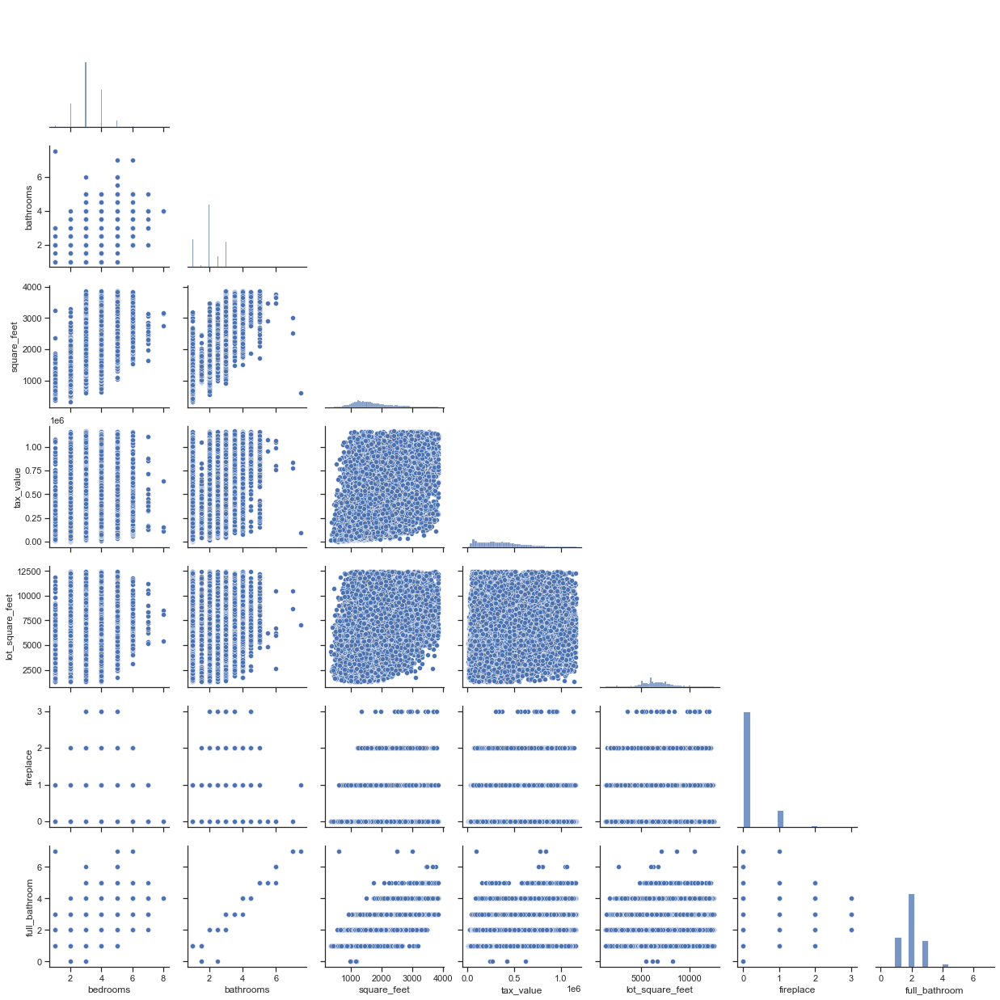

In [10]:
train_scatter = train[['bedrooms', 'bathrooms', 'square_feet', 'tax_value', 'lot_square_feet', 'fireplace', 'full_bathroom']]
sns.set_theme(style="ticks")
sns.pairplot(train_scatter, corner=True)


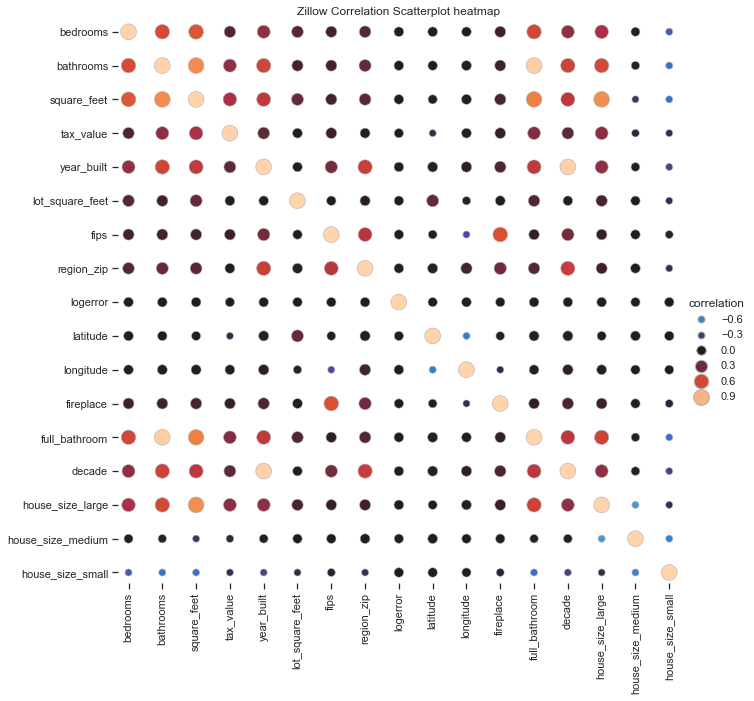

In [11]:
train_corr = train.corr().stack().reset_index(name="correlation")
g = sns.relplot(
    data=train_corr,
    x="level_0", y="level_1", hue="correlation", size="correlation",
    palette="icefire", hue_norm=(-1, 1), edgecolor=".7",
    height=10, sizes=(50, 250), size_norm=(-.2, .8))
g.set(xlabel="", ylabel="", title='Zillow Correlation Scatterplot heatmap', aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.02)
for label in g.ax.get_xticklabels():
    label.set_rotation(90)
for artist in g.legend.legendHandles:
    artist.set_edgecolor(".7")

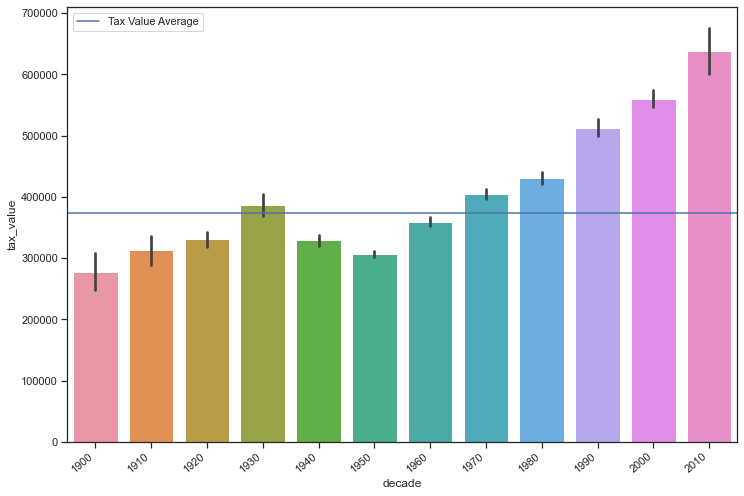

In [12]:
plt.figure(figsize = (12, 8))
ax = sns.barplot(x='decade', y='tax_value', data=train)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
tax_value_avg = train.tax_value.mean()
plt.axhline(tax_value_avg, label='Tax Value Average')
plt.legend()
plt.show()

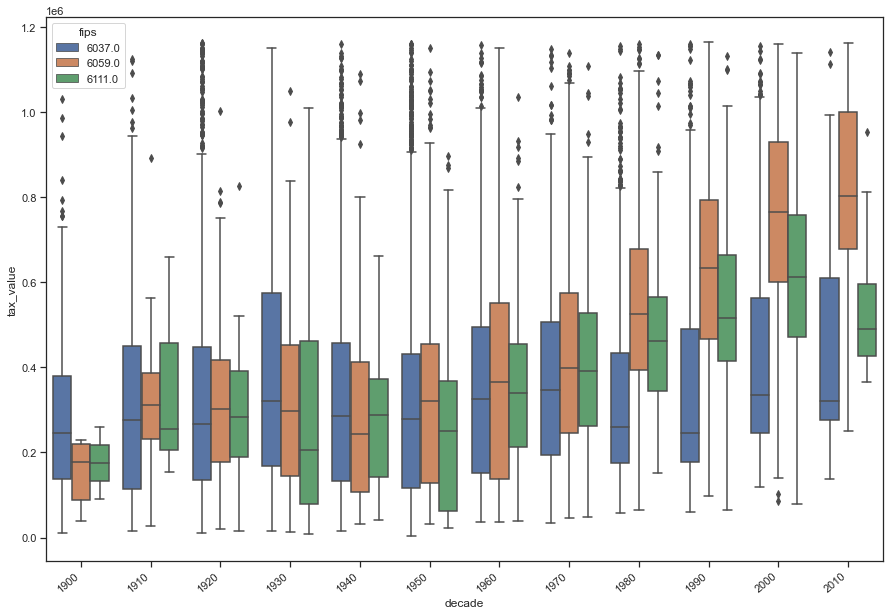

In [13]:
plt.figure(figsize = (15, 10))
ax = sns.boxplot(x='decade', y='tax_value', data=train, hue='fips')
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

<Figure size 864x720 with 0 Axes>

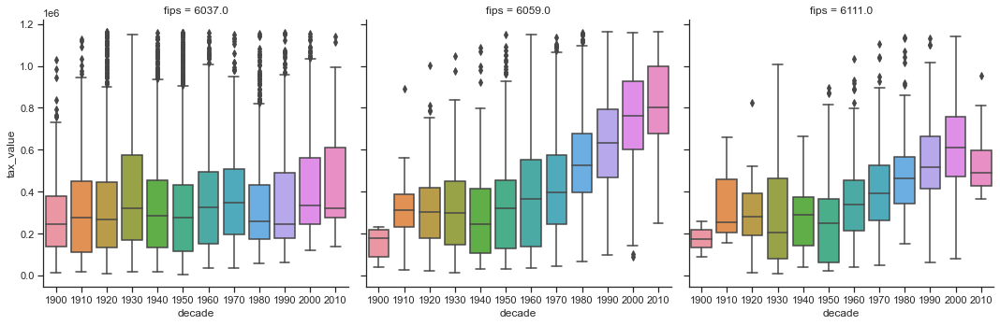

In [14]:
plt.figure(figsize = (12, 10))
ax = sns.catplot(x='decade', y='tax_value', data=train, col='fips', kind='box')
plt.show()

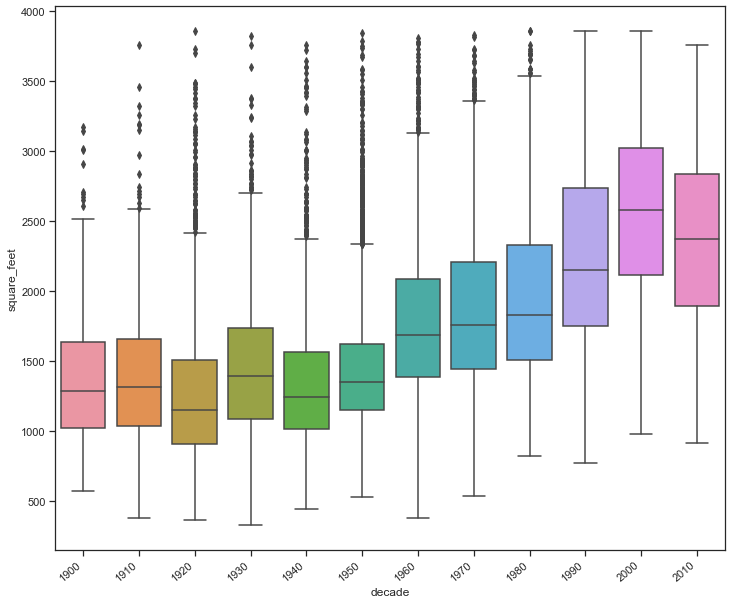

In [15]:
plt.figure(figsize = (12, 10))
ax = sns.boxplot(x='decade', y='square_feet', data=train)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
plt.show()

In [16]:
fig = px.scatter_mapbox(train, lat="latitude", lon="longitude", hover_name="fips_str", hover_data=["region_zip", "tax_value", "bedrooms", "bathrooms", "square_feet"],
                        color_discrete_sequence=["blue"], color="tax_value", zoom=8, height=700)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

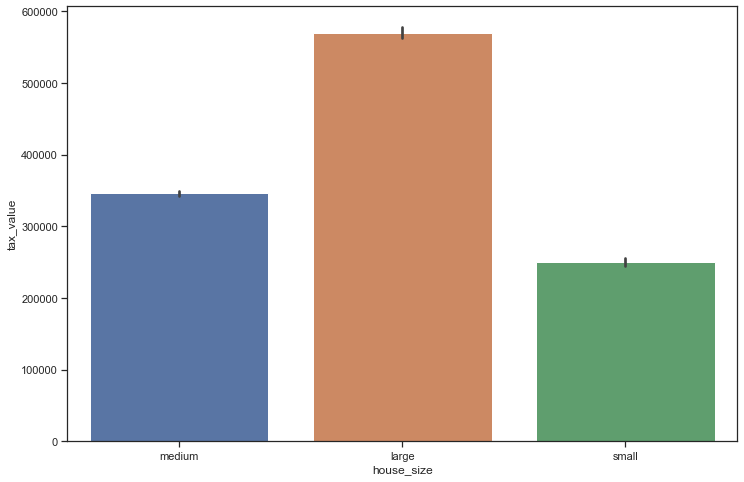

In [17]:
plt.figure(figsize = (12, 8))
ax = sns.barplot(x='house_size', y='tax_value', data=train)
ax.set_xticklabels(ax.get_xticklabels())
plt.show()

<AxesSubplot:xlabel='year_built', ylabel='square_feet'>

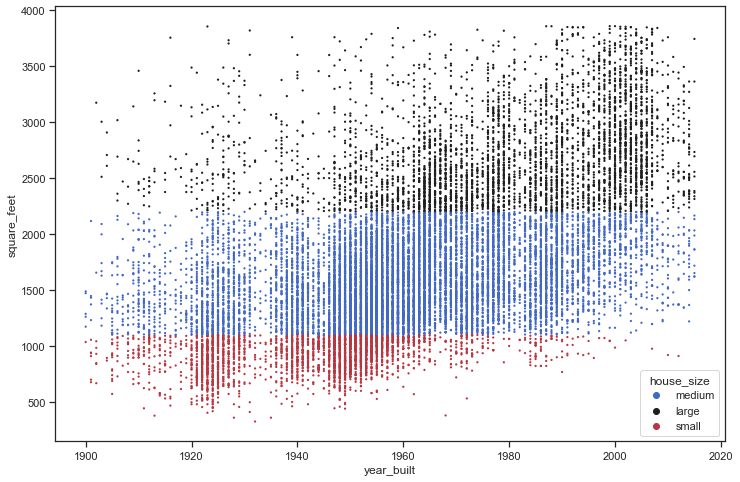

In [18]:
f, ax = plt.subplots(figsize=(12, 8))
sns.scatterplot(x="year_built", y="square_feet",
                hue="house_size", s=5,
                palette="icefire",
                sizes=(1, 8), linewidth=0,
                data=train, ax=ax)

<AxesSubplot:xlabel='year_built', ylabel='tax_value'>

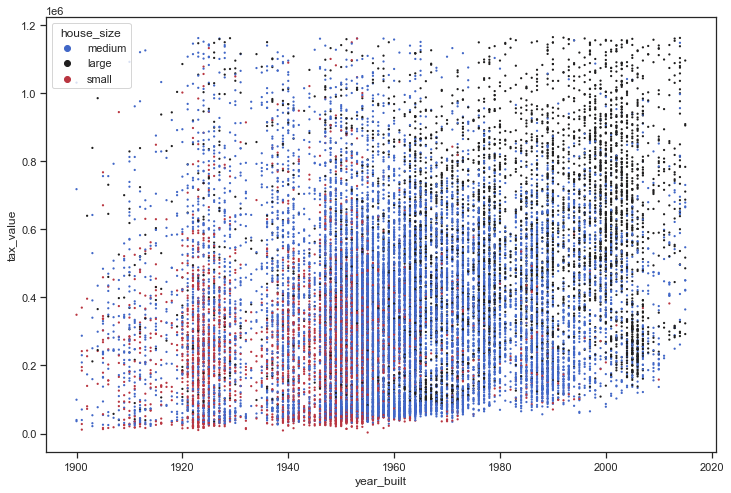

In [19]:
f, ax = plt.subplots(figsize=(12, 8))
sns.scatterplot(x="year_built", y="tax_value",
                hue="house_size", s=5,
                palette="icefire",
                sizes=(1, 8), linewidth=0,
                data=train, ax=ax)

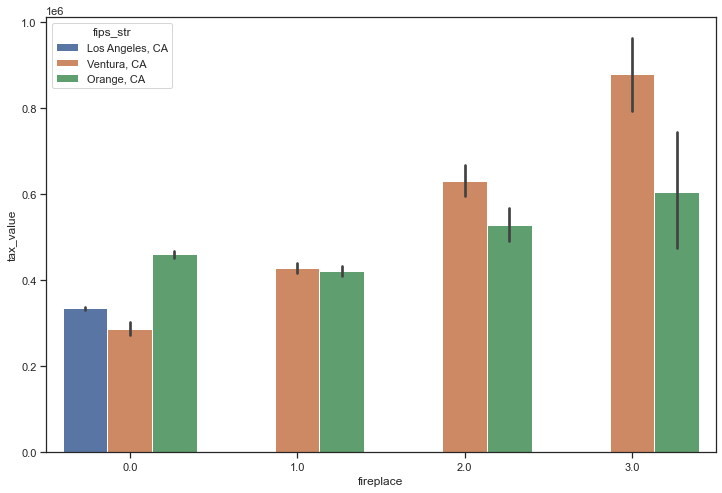

In [20]:
plt.figure(figsize = (12, 8))
ax = sns.barplot(x='fireplace', y='tax_value', data=train, hue='fips_str')
ax.set_xticklabels(ax.get_xticklabels())
plt.show()

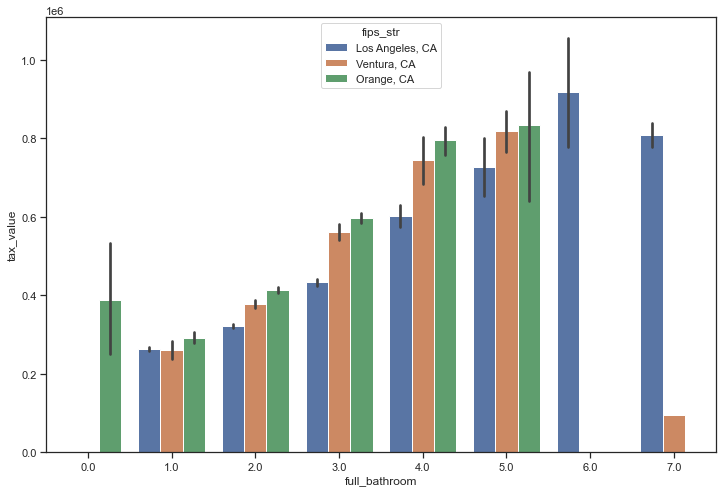

In [21]:
plt.figure(figsize = (12, 8))
ax = sns.barplot(x='full_bathroom', y='tax_value', data=train, hue='fips_str')
ax.set_xticklabels(ax.get_xticklabels())
plt.show()

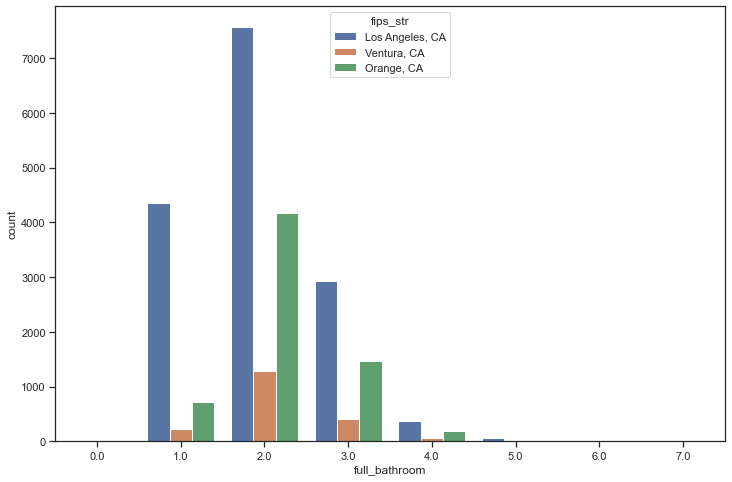

In [22]:
plt.figure(figsize = (12, 8))
sns.countplot(x='full_bathroom', data=train, hue='fips_str')
plt.show()

In [23]:
train.full_bathroom.value_counts()

2.0    13025
1.0     5299
3.0     4821
4.0      615
5.0       73
0.0        4
6.0        4
7.0        3
Name: full_bathroom, dtype: int64

In [24]:
train.head()

,bedrooms,bathrooms,square_feet,tax_value,year_built,lot_square_feet,fips,region_zip,logerror,transaction_date,latitude,longitude,fireplace,full_bathroom,decade,fips_str,house_size,house_size_large,house_size_medium,house_size_small
24462,3.0,3.0,1588.0,540000.0,1989.0,6889.0,6037.0,96377.0,0.004889,2017-05-10,34.433601,-118.552887,0.0,3.0,1980,"Los Angeles, CA",medium,0,1,0
12994,3.0,2.0,1532.0,72387.0,1969.0,8145.0,6111.0,96351.0,-0.033810,2017-03-23,34.178609,-118.941942,1.0,2.0,1960,"Ventura, CA",medium,0,1,0
51468,3.0,2.0,1816.0,769559.0,1942.0,6423.0,6037.0,96291.0,0.114923,2017-09-11,34.166946,-118.163572,0.0,2.0,1940,"Los Angeles, CA",medium,0,1,0
13952,4.0,3.0,2476.0,128705.0,1964.0,7727.0,6037.0,96346.0,0.035455,2017-03-17,34.243642,-118.562135,0.0,3.0,1960,"Los Angeles, CA",large,1,0,0
5671,2.0,1.0,782.0,405000.0,1950.0,5323.0,6037.0,96208.0,-0.004211,2017-02-09,33.908284,-118.133903,0.0,1.0,1950,"Los Angeles, CA",small,0,0,1


We reject the null hypothesis that The Year Built in LA and Tax value are independent
There is a relationship between tax value and the Year Built in LA


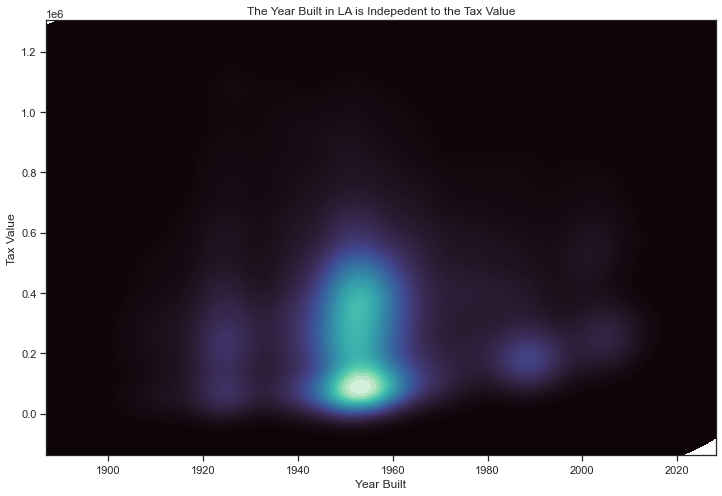

In [25]:
LA = train[train.fips == 6037]
plt.figure(figsize = (12, 8))
sns.kdeplot(
    data=LA, x="year_built", y="tax_value",
    fill=True, thresh=0, levels=100, cmap="mako")
plt.title('The Year Built in LA is Indepedent to the Tax Value')
plt.xlabel('Year Built')
plt.ylabel('Tax Value')
alpha = 0.05
null_hyp = 'The Year Built in LA and Tax value are independent'
alt_hyp = 'There is a relationship between tax value and the Year Built in LA'
observed = pd.crosstab(LA.tax_value, LA.year_built)
chi2, p, degf, expected = stats.chi2_contingency(observed)
if p < alpha:
    print('We reject the null hypothesis that', null_hyp)
    print(alt_hyp)
else:
    print('We fail to reject the null hypothesis that', null_hyp)
    print('There appears to be no relationship between tax value and the Year Built in LA')
    

In [26]:
def select_kbest(X_train, y_train):
    n = input("How many desired features? ")
    n = int(n)
    f_selector = SelectKBest(f_regression, k=n)
    f_selector.fit(X_train, y_train)
    feature_mask = f_selector.get_support()
    f_feature = X_train.iloc[:,feature_mask].columns.tolist()
    print(f_feature)

In [81]:
X_cols = ['bedrooms', 'bathrooms', 'square_feet', 'lot_square_feet', 'full_bathroom', 'year_built', 'fips', 'region_zip', 'house_size_large', 'house_size_small', 'decade']
X_train = train_scaled[X_cols]
y_train = train_scaled.tax_value

X_validate = validate_scaled[X_cols]
y_validate = validate_scaled.tax_value

X_test = test_scaled[X_cols]
y_test = test_scaled.tax_value

In [28]:
select_kbest(X_train, y_train)

How many desired features? 5
['bathrooms', 'square_feet', 'full_bathroom', 'year_built', 'house_size_large']


In [29]:
def rfe(X_train, y_train):
    # initialize the ML algorithm
    lm = LinearRegression()
    
    # input for desired features  
    n = input("How many desired features? ")
    n = int(n)

    # create the rfe object, indicating the ML object (lm) and the number of features I want to end up with. 
    rfe = RFE(lm, n_features_to_select=n)

    # fit the data using RFE
    rfe.fit(X_train, y_train)  

    # get the mask of the columns selected
    feature_mask = rfe.support_

    # get list of the column names. 
    rfe_feature = X_train.iloc[:,feature_mask].columns.tolist()
    
    # prints the ffe features     
    print(rfe_feature)

In [30]:
rfe(X_train, y_train)

How many desired features? 5
['bedrooms', 'bathrooms', 'square_feet', 'lot_square_feet', 'full_bathroom']


In [82]:
# We need y_train and y_validate to be dataframes to append the new columns with predicted values. 
y_train = pd.DataFrame(y_train)
y_validate = pd.DataFrame(y_validate)

# 1. Predict tax_value_pred_mean
tax_value_pred_mean = y_train['tax_value'].mean()
y_train['tax_value_pred_mean'] = tax_value_pred_mean
y_validate['tax_value_pred_mean'] = tax_value_pred_mean

# 2. compute tax_value_pred_median
tax_value_pred_median = y_train['tax_value'].median()
y_train['tax_value_pred_median'] = tax_value_pred_median
y_validate['tax_value_pred_median'] = tax_value_pred_median

# 3. RMSE of tax_value_pred_mean
rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_mean)**(1/2)
rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_mean)**(1/2)

print("RMSE using Mean\nTrain/In-Sample: ", round(rmse_train, 2), 
      "\nValidate/Out-of-Sample: ", round(rmse_validate, 2))

# 4. RMSE of tax_value_pred_median
rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_median)**(1/2)
rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_median)**(1/2)

print("RMSE using Median\nTrain/In-Sample: ", round(rmse_train, 2), 
      "\nValidate/Out-of-Sample: ", round(rmse_validate, 2))

RMSE using Mean
Train/In-Sample:  247288.36 
Validate/Out-of-Sample:  249267.04
RMSE using Median
Train/In-Sample:  250005.56 
Validate/Out-of-Sample:  251965.94


In [62]:
y_train.head()

,tax_value,tax_value_pred_mean,tax_value_pred_median
24462,540000.0,374129.261701,337307.0
12994,72387.0,374129.261701,337307.0
51468,769559.0,374129.261701,337307.0
13952,128705.0,374129.261701,337307.0
5671,405000.0,374129.261701,337307.0


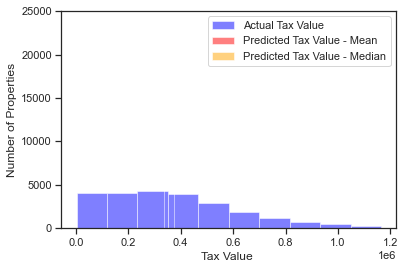

In [33]:
# plot to visualize actual vs predicted. 
plt.hist(y_train.tax_value, color='blue', alpha=.5, label="Actual Tax Value")
plt.hist(y_train.tax_value_pred_mean, bins=1, color='red', alpha=.5, 
         label="Predicted Tax Value - Mean")
plt.hist(y_train.tax_value_pred_median, bins=1, color='orange', alpha=.5,
         label="Predicted Tax Value - Median")
plt.xlabel("Tax Value ")
plt.ylabel("Number of Properties")
plt.legend()
plt.show()

In [83]:
# create the model object
lm = LinearRegression(normalize=True)

# fit the model to our training data. We must specify the column in y_train, 
# since we have converted it to a dataframe from a series! 
lm.fit(X_train, y_train.tax_value)

# predict train
y_train['tax_value_pred_lm'] = lm.predict(X_train)

# evaluate: rmse
rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_lm)**(1/2)

# predict validate
y_validate['tax_value_pred_lm'] = lm.predict(X_validate)

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_lm)**(1/2)

print("RMSE for OLS using LinearRegression\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)

RMSE for OLS using LinearRegression
Training/In-Sample:  212395.08565710572 
Validation/Out-of-Sample:  340449.32546775386


In [84]:
X_train.head()

,bedrooms,bathrooms,square_feet,lot_square_feet,full_bathroom,year_built,fips,region_zip,house_size_large,house_size_small,decade
24464,0.250,0.333333,0.590186,0.539205,0.428571,1957.0,6037.0,96247.0,1,0,1950
13009,0.125,0.000000,0.452413,0.606248,0.142857,1947.0,6037.0,96192.0,0,0,1940
51460,0.375,0.333333,0.668105,0.451486,0.428571,1945.0,6037.0,96045.0,1,0,1940
13951,0.250,0.166667,0.398490,0.419531,0.285714,1969.0,6059.0,96964.0,0,0,1960
5644,0.250,0.000000,0.211378,0.411833,0.142857,1957.0,6037.0,96488.0,0,1,1950


In [85]:
# create the model object
lars = LassoLars(alpha=1.0)

# fit the model to our training data. We must specify the column in y_train, 
# since we have converted it to a dataframe from a series! 
lars.fit(X_train, y_train.tax_value)

# predict train
y_train['tax_value_pred_lars'] = lars.predict(X_train)

# evaluate: rmse
rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_lars)**(1/2)

# predict validate
y_validate['tax_value_pred_lars'] = lars.predict(X_validate)

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_lars)**(1/2)

print("RMSE for Lasso + Lars\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)

RMSE for Lasso + Lars
Training/In-Sample:  212401.7522282011 
Validation/Out-of-Sample:  336936.9493879281


In [86]:
# create the model object
glm = TweedieRegressor(power=1, alpha=0)

# fit the model to our training data. We must specify the column in y_train, 
# since we have converted it to a dataframe from a series! 
glm.fit(X_train, y_train.tax_value)

# predict train
y_train['tax_value_pred_glm'] = glm.predict(X_train)

# evaluate: rmse
rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_glm)**(1/2)

# predict validate
y_validate['tax_value_pred_glm'] = glm.predict(X_validate)

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_glm)**(1/2)

print("RMSE for GLM using Tweedie, power=1 & alpha=0\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)

RMSE for GLM using Tweedie, power=1 & alpha=0
Training/In-Sample:  247288.35592067384 
Validation/Out-of-Sample:  249267.03927064317


In [87]:
# make the polynomial features to get a new set of features
pf = PolynomialFeatures(degree=2)

# fit and transform X_train_scaled
X_train_degree2 = pf.fit_transform(X_train)

# transform X_validate_scaled & X_test_scaled
X_validate_degree2 = pf.transform(X_validate)
X_test_degree2 = pf.transform(X_test)

# create the model object
lm2 = LinearRegression(normalize=True)

# fit the model to our training data. We must specify the column in y_train, 
# since we have converted it to a dataframe from a series! 
lm2.fit(X_train_degree2, y_train.tax_value)

# predict train
y_train['tax_value_pred_lm2'] = lm2.predict(X_train_degree2)

# evaluate: rmse
rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_lm2)**(1/2)

# predict validate
y_validate['tax_value_pred_lm2'] = lm2.predict(X_validate_degree2)

# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_lm2)**(1/2)

print("RMSE for Polynomial Model, degrees=2\nTraining/In-Sample: ", rmse_train, 
      "\nValidation/Out-of-Sample: ", rmse_validate)


RMSE for Polynomial Model, degrees=2
Training/In-Sample:  204839.26771816998 
Validation/Out-of-Sample:  173357020.8588094


In [96]:
y_validate.describe().T

,count,mean,std,min,25%,50%,75%,max
tax_value,10219.0,373221.107153,2.492792e+05,3254.000000,172189.500000,337694.000000,521536.000000,1.163971e+06
tax_value_pred_mean,10219.0,373200.342896,1.874378e-08,373200.342895,373200.342895,373200.342895,373200.342895,3.732003e+05
tax_value_pred_median,10219.0,336441.000000,0.000000e+00,336441.000000,336441.000000,336441.000000,336441.000000,3.364410e+05
tax_value_pred_lm,10219.0,371492.483891,1.262073e+05,60086.465539,277663.247867,340822.260240,443806.145064,9.804035e+05
tax_value_pred_lars,10219.0,371524.323804,1.257004e+05,60833.348116,278236.276017,341217.156394,442879.103527,9.438585e+05
tax_value_pred_glm,10219.0,373200.342896,1.909305e-08,373200.342895,373200.342895,373200.342895,373200.342895,3.732003e+05
tax_value_pred_lm2,10219.0,371473.322882,1.385026e+05,38992.022254,282045.425560,344611.322206,435165.018901,2.258921e+06


In [89]:
# Getting rid of the negative predicted value
replace_lm = y_validate['tax_value_pred_lm'].min()
replace_lm_avg = y_validate['tax_value_pred_lm'].mean()
y_validate['tax_value_pred_lm'] = y_validate['tax_value_pred_lm'].replace(replace_lm, replace_lm_avg)

In [90]:
# Getting rid of the negative predicted value
replace_lars = y_validate['tax_value_pred_lars'].min()
replace_lars_avg = y_validate['tax_value_pred_lars'].mean()
y_validate['tax_value_pred_lars'] = y_validate['tax_value_pred_lars'].replace(replace_lars, replace_lars_avg)


In [95]:
# Getting rid of the negative predicted value
replace_lm2 = y_validate['tax_value_pred_lm2'].min()
replace_lm2_avg = y_validate['tax_value_pred_lm2'].mode()
y_validate['tax_value_pred_lm2'] = y_validate['tax_value_pred_lm2'].replace(replace_lm2, replace_lm2_avg[0])


In [97]:
# evaluate: rmse
rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_lars)**(1/2)
# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_lars)**(1/2)
print("RMSE for Lasso + Lars\nTraining/In-Sample: ", round(rmse_train, 2), 
      "\nValidation/Out-of-Sample: ", round(rmse_validate, 2))
print("R2 Value:", round(r2_score(y_train.tax_value, y_train.tax_value_pred_lars), 2))
print('-----------------------------------------------')
# evaluate: rmse
rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_lm)**(1/2)
# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_lm)**(1/2)
print("RMSE for OLS using LinearRegression\nTraining/In-Sample: ", round(rmse_train, 2), 
      "\nValidation/Out-of-Sample: ", round(rmse_validate, 2))
print("R2 Value:", round(r2_score(y_train.tax_value, y_train.tax_value_pred_lm), 2))
print('-----------------------------------------------')
# evaluate: rmse
rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_lm2)**(1/2)
# evaluate: rmse
rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_lm2)**(1/2)
print("RMSE for Polynomial Model, degrees=2\nTraining/In-Sample: ", round(rmse_train, 2), 
      "\nValidation/Out-of-Sample: ", round(rmse_validate, 2))
print("R2 Value:", round(r2_score(y_train.tax_value, y_train.tax_value_pred_lm2), 2))

RMSE for Lasso + Lars
Training/In-Sample:  212401.75 
Validation/Out-of-Sample:  216116.17
R2 Value: 0.26
-----------------------------------------------
RMSE for OLS using LinearRegression
Training/In-Sample:  212395.09 
Validation/Out-of-Sample:  216108.91
R2 Value: 0.26
-----------------------------------------------
RMSE for Polynomial Model, degrees=2
Training/In-Sample:  204839.27 
Validation/Out-of-Sample:  208981.93
R2 Value: 0.31


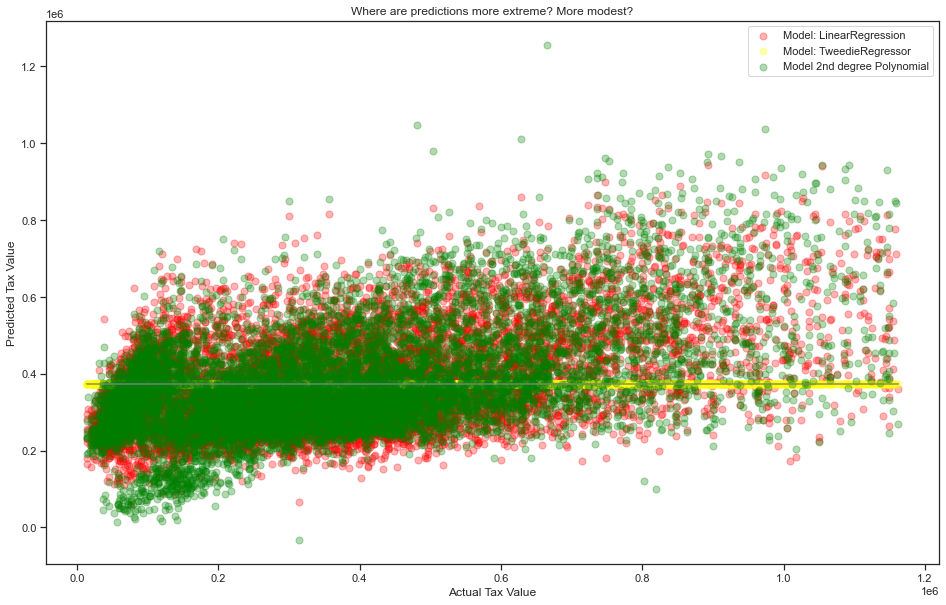

In [45]:
# y_validate.head()
plt.figure(figsize=(16,10))
plt.plot(y_validate.tax_value, y_validate.tax_value_pred_mean, alpha=.7, color="gray", label='_nolegend_')
# plt.annotate("Baseline: Predict Using Mean", (0, 400000.5), rotation=90)
# plt.plot(y_validate.tax_value, y_validate.tax_value, alpha=.5, color="blue", label='_nolegend_')
# plt.annotate("The Ideal Line: Predicted = Actual", (20000, 0), rotation=29.5)

plt.scatter(y_validate.tax_value, y_validate.tax_value_pred_lm, 
            alpha=.3, color="red", s=50, label="Model: LinearRegression")
plt.scatter(y_validate.tax_value, y_validate.tax_value_pred_glm, 
            alpha=.3, color="yellow", s=50, label="Model: TweedieRegressor")
plt.scatter(y_validate.tax_value, y_validate.tax_value_pred_lm2, 
            alpha=.3, color="green", s=50, label="Model 2nd degree Polynomial")
plt.legend()
plt.xlabel("Actual Tax Value")
plt.ylabel("Predicted Tax Value")
plt.title("Where are predictions more extreme? More modest?")
# plt.annotate("The polynomial model appears to overreact to noise", (2.0, -10))
# plt.annotate("The OLS model (LinearRegression)\n appears to be most consistent", (15.5, 3))
plt.show()

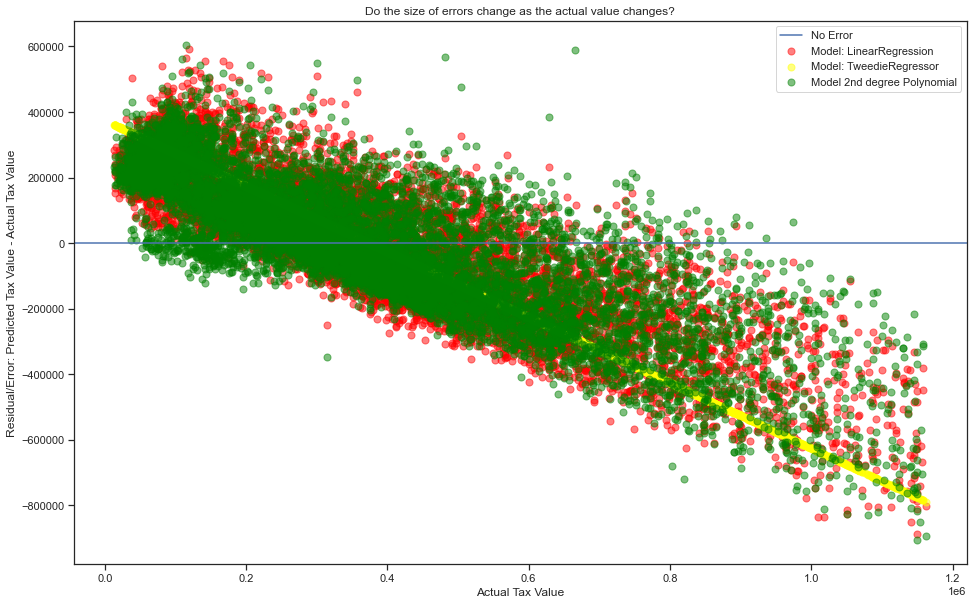

In [46]:
# y_validate.head()
plt.figure(figsize=(16,10))
plt.axhline(label="No Error")
plt.scatter(y_validate.tax_value, y_validate.tax_value_pred_lm-y_validate.tax_value, 
            alpha=.5, color="red", s=50, label="Model: LinearRegression")
plt.scatter(y_validate.tax_value, y_validate.tax_value_pred_glm-y_validate.tax_value, 
            alpha=.5, color="yellow", s=50, label="Model: TweedieRegressor")
plt.scatter(y_validate.tax_value, y_validate.tax_value_pred_lm2-y_validate.tax_value, 
            alpha=.5, color="green", s=50, label="Model 2nd degree Polynomial")
plt.legend()
plt.xlabel("Actual Tax Value")
plt.ylabel("Residual/Error: Predicted Tax Value - Actual Tax Value")
plt.title("Do the size of errors change as the actual value changes?")
plt.show()


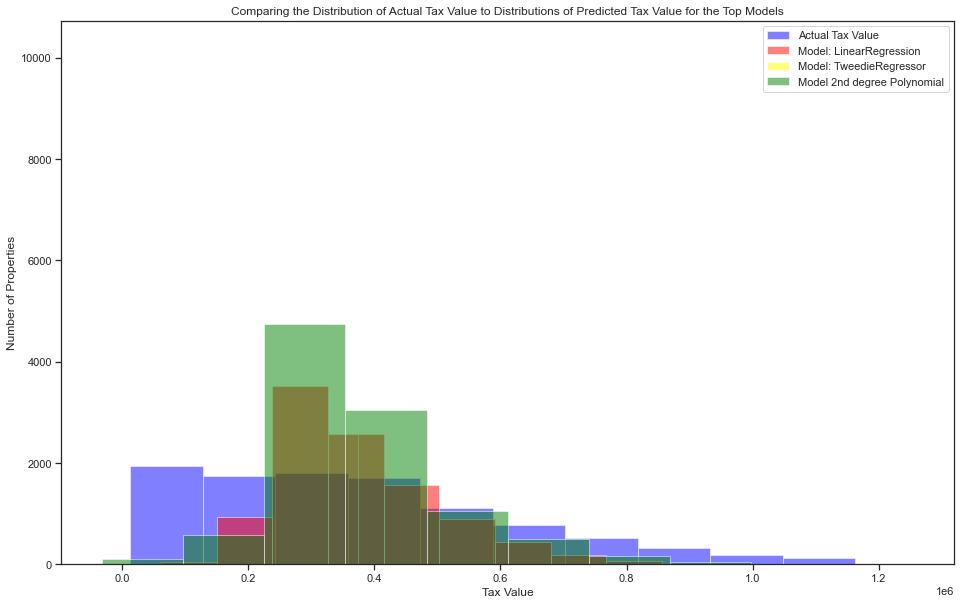

In [47]:
# plot to visualize actual vs predicted. 
plt.figure(figsize=(16,10))
plt.hist(y_validate.tax_value, color='blue', alpha=.5, label="Actual Tax Value")
plt.hist(y_validate.tax_value_pred_lm, color='red', alpha=.5, label="Model: LinearRegression")
plt.hist(y_validate.tax_value_pred_glm, color='yellow', alpha=.5, label="Model: TweedieRegressor")
plt.hist(y_validate.tax_value_pred_lm2, color='green', alpha=.5, label="Model 2nd degree Polynomial")
plt.xlabel("Tax Value")
plt.ylabel("Number of Properties")
plt.title("Comparing the Distribution of Actual Tax Value to Distributions of Predicted Tax Value for the Top Models")
plt.legend()
plt.show()

<hr style="border-top:10px groove DodgerBlue; margin-top: 2px; margin-bottom: 2px">

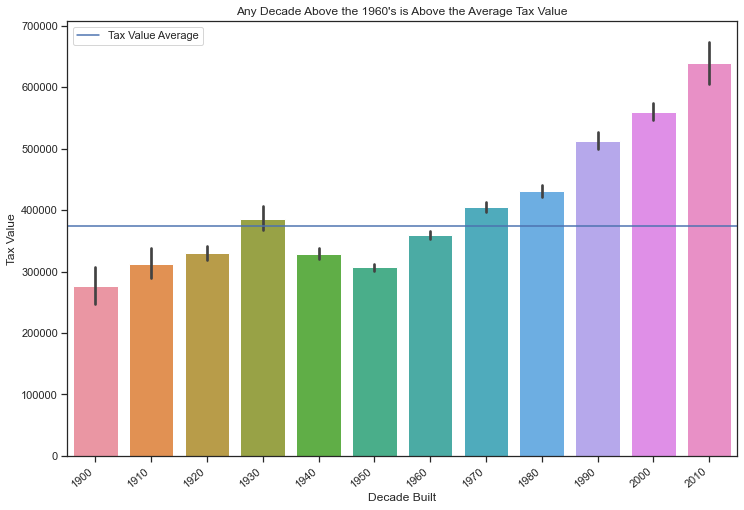

We reject the null hypothesis that The Decade Built and Tax value are independent
There is a relationship between tax value and the Decade Built


In [48]:
plt.figure(figsize = (12, 8))
ax = sns.barplot(x='decade', y='tax_value', data=train)
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
tax_value_avg = train.tax_value.mean()
plt.axhline(tax_value_avg, label='Tax Value Average')
plt.legend()
plt.xlabel('Decade Built')
plt.ylabel('Tax Value')
plt.title("Any Decade Above the 1960's is Above the Average Tax Value")
plt.show()
alpha = 0.05
null_hyp = 'The Decade Built and Tax value are independent'
alt_hyp = 'There is a relationship between tax value and the Decade Built'
observed = pd.crosstab(train.tax_value, train.decade)
chi2, p, degf, expected = stats.chi2_contingency(observed)
if p < alpha:
    print('We reject the null hypothesis that', null_hyp)
    print(alt_hyp)
else:
    print('We fail to reject the null hypothesis that', null_hyp)
    print('There appears to be no relationship between Tax Value and the Decade Built')
    

We reject the null hypothesis that The Year Built in LA and Tax value are independent
There is a relationship between Tax Value and the Year Built in LA


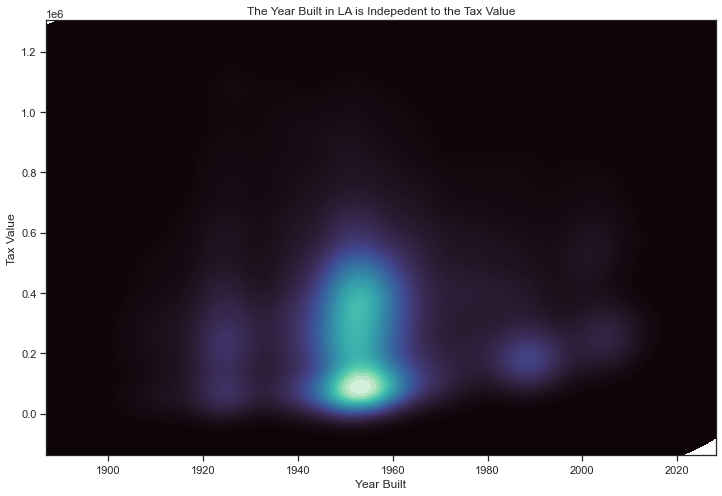

In [49]:
LA = train[train.fips == 6037]
plt.figure(figsize = (12, 8))
sns.kdeplot(
    data=LA, x="year_built", y="tax_value",
    fill=True, thresh=0, levels=100, cmap="mako")
plt.title('The Year Built in LA is Indepedent to the Tax Value')
plt.xlabel('Year Built')
plt.ylabel('Tax Value')
alpha = 0.05
null_hyp = 'The Year Built in LA and Tax value are independent'
alt_hyp = 'There is a relationship between Tax Value and the Year Built in LA'
observed = pd.crosstab(LA.tax_value, LA.year_built)
chi2, p, degf, expected = stats.chi2_contingency(observed)
if p < alpha:
    print('We reject the null hypothesis that', null_hyp)
    print(alt_hyp)
else:
    print('We fail to reject the null hypothesis that', null_hyp)
    print('There appears to be no relationship between Tax Value and the Year Built in LA')
    

In [50]:
fig = px.scatter_mapbox(train, lat="latitude", lon="longitude", hover_name="fips_str", hover_data=["region_zip", "tax_value", "bedrooms", "bathrooms", "square_feet"],
                        color_discrete_sequence=["blue"], color="tax_value", zoom=8.2, height=700)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

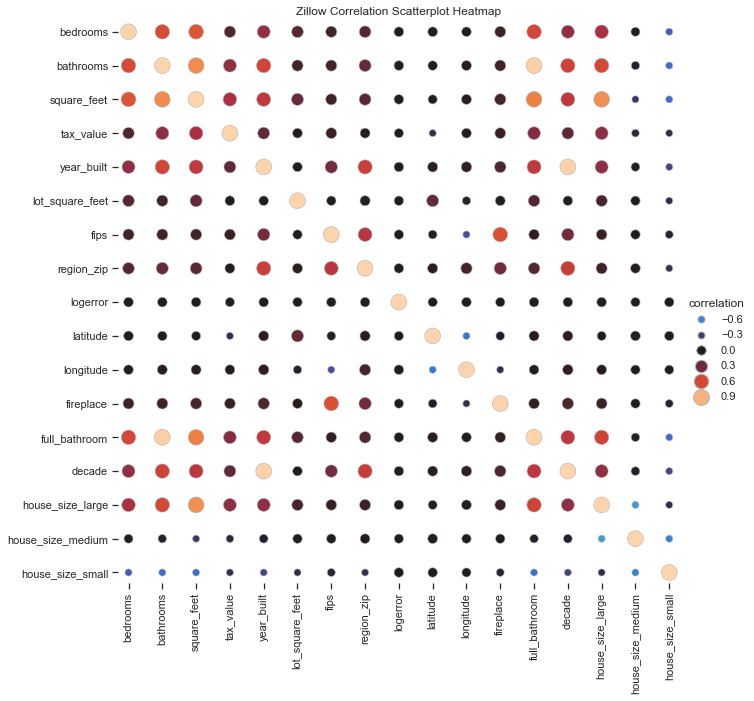

In [51]:
train_corr = train.corr().stack().reset_index(name="correlation")
g = sns.relplot(
    data=train_corr,
    x="level_0", y="level_1", hue="correlation", size="correlation",
    palette="icefire", hue_norm=(-1, 1), edgecolor=".7",
    height=10, sizes=(50, 250), size_norm=(-.2, .8))
g.set(xlabel="", ylabel="", title='Zillow Correlation Scatterplot Heatmap', aspect="equal")
g.despine(left=True, bottom=True)
g.ax.margins(.02)
for label in g.ax.get_xticklabels():
    label.set_rotation(90)
for artist in g.legend.legendHandles:
    artist.set_edgecolor(".7")

In [56]:
# We need y_test to be a dataframe 
y_test = pd.DataFrame(y_test)

# make the polynomial features to get a new set of features
pf = PolynomialFeatures(degree=2)

# fit and transform X_train_scaled
X_train_degree2 = pf.fit_transform(X_train)

# transform X_validate_scaled & X_test_scaled
X_validate_degree2 = pf.transform(X_validate)
X_test_degree2 = pf.transform(X_test)

# create the model object
lm2 = LinearRegression(normalize=True)

# fit the model to our training data. We must specify the column in y_train, 
# since we have converted it to a dataframe from a series! 
lm2.fit(X_train_degree2, y_train.tax_value)
    
# predict test
y_test['tax_value_pred_lm2'] = lm2.predict(X_test_degree2)

rmse_test = mean_squared_error(y_test.tax_value, y_test.tax_value_pred_lm2)**(1/2)
print("RMSE for Polynomial Model, degrees=2\nTest/Out-of-Sample: ", round(rmse_train, 2))

RMSE for Polynomial Model, degrees=2
Test/Out-of-Sample:  204970.35


In [57]:
train.dtypes

bedrooms             float64
bathrooms            float64
square_feet          float64
tax_value            float64
year_built           float64
lot_square_feet      float64
fips                 float64
region_zip           float64
logerror             float64
transaction_date      object
latitude             float64
longitude            float64
fireplace            float64
full_bathroom        float64
decade                 int64
fips_str              object
house_size            object
house_size_large       uint8
house_size_medium      uint8
house_size_small       uint8
dtype: object

In [58]:
y_train.dtypes

tax_value                float64
tax_value_pred_mean      float64
tax_value_pred_median    float64
tax_value_pred_lm        float64
tax_value_pred_lars      float64
tax_value_pred_glm       float64
tax_value_pred_lm2       float64
dtype: object

In [99]:
def eval_models(y_train, y_validate, X_train, X_validate, X_test):
    # create the model object
    lm = LinearRegression(normalize=True)

    # fit the model to our training data. We must specify the column in y_train, 
    # since we have converted it to a dataframe from a series! 
    lm.fit(X_train, y_train.tax_value)

    # predict train
    y_train['tax_value_pred_lm'] = lm.predict(X_train)

    # predict validate
    y_validate['tax_value_pred_lm'] = lm.predict(X_validate)

    # Getting rid of the negative predicted value
    replace_lm = y_validate['tax_value_pred_lm'].min()
    replace_lm_avg = y_validate['tax_value_pred_lm'].mean()
    y_validate['tax_value_pred_lm'] = y_validate['tax_value_pred_lm'].replace(replace_lm, replace_lm_avg)

    # create the model object
    lars = LassoLars(alpha=1.0)

    # fit the model to our training data. We must specify the column in y_train, 
    # since we have converted it to a dataframe from a series! 
    lars.fit(X_train, y_train.tax_value)

    # predict train
    y_train['tax_value_pred_lars'] = lars.predict(X_train)

    # predict validate
    y_validate['tax_value_pred_lars'] = lars.predict(X_validate)

    # Getting rid of the negative predicted value
    replace_lars = y_validate['tax_value_pred_lars'].min()
    replace_lars_avg = y_validate['tax_value_pred_lars'].mean()
    y_validate['tax_value_pred_lars'] = y_validate['tax_value_pred_lars'].replace(replace_lars, replace_lars_avg)

    # make the polynomial features to get a new set of features
    pf = PolynomialFeatures(degree=2)

    # fit and transform X_train_scaled
    X_train_degree2 = pf.fit_transform(X_train)

    # transform X_validate_scaled & X_test_scaled
    X_validate_degree2 = pf.transform(X_validate)
    X_test_degree2 = pf.transform(X_test)

    # create the model object
    lm2 = LinearRegression(normalize=True)

    # fit the model to our training data. We must specify the column in y_train, 
    # since we have converted it to a dataframe from a series! 
    lm2.fit(X_train_degree2, y_train.tax_value)

    # predict train
    y_train['tax_value_pred_lm2'] = lm2.predict(X_train_degree2)

    # predict validate
    y_validate['tax_value_pred_lm2'] = lm2.predict(X_validate_degree2)

    # Getting rid of the negative predicted value
    replace_lm2 = y_validate['tax_value_pred_lm2'].min()
    replace_lm2_avg = y_validate['tax_value_pred_lm2'].mode()
    y_validate['tax_value_pred_lm2'] = y_validate['tax_value_pred_lm2'].replace(replace_lm2, replace_lm2_avg[0])

    # evaluate: rmse
    rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_lars)**(1/2)
    # evaluate: rmse
    rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_lars)**(1/2)
    print("RMSE for Lasso + Lars\nTraining/In-Sample: ", round(rmse_train, 2), 
        "\nValidation/Out-of-Sample: ", round(rmse_validate, 2))
    print("R2 Value:", round(r2_score(y_train.tax_value, y_train.tax_value_pred_lars), 2))
    print('-----------------------------------------------')
    # evaluate: rmse
    rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_lm)**(1/2)
    # evaluate: rmse
    rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_lm)**(1/2)
    print("RMSE for OLS using LinearRegression\nTraining/In-Sample: ", round(rmse_train, 2), 
        "\nValidation/Out-of-Sample: ", round(rmse_validate, 2))
    print("R2 Value:", round(r2_score(y_train.tax_value, y_train.tax_value_pred_lm), 2))
    print('-----------------------------------------------')
    # evaluate: rmse
    rmse_train = mean_squared_error(y_train.tax_value, y_train.tax_value_pred_lm2)**(1/2)
    # evaluate: rmse
    rmse_validate = mean_squared_error(y_validate.tax_value, y_validate.tax_value_pred_lm2)**(1/2)
    print("RMSE for Polynomial Model, degrees=2\nTraining/In-Sample: ", round(rmse_train, 2), 
        "\nValidation/Out-of-Sample: ", round(rmse_validate, 2))
    print("R2 Value:", round(r2_score(y_train.tax_value, y_train.tax_value_pred_lm2), 2))

In [100]:
eval_models(y_train, y_validate, X_train, X_validate, X_test)

RMSE for Lasso + Lars
Training/In-Sample:  212401.75 
Validation/Out-of-Sample:  216116.17
R2 Value: 0.26
-----------------------------------------------
RMSE for OLS using LinearRegression
Training/In-Sample:  212395.09 
Validation/Out-of-Sample:  216108.91
R2 Value: 0.26
-----------------------------------------------
RMSE for Polynomial Model, degrees=2
Training/In-Sample:  204839.27 
Validation/Out-of-Sample:  208981.93
R2 Value: 0.31
